In [1]:
import numpy as np
import healpy as hp
import matplotlib.pyplot as plt
import pygsm

### PyGSM is a very light weight implementation to for creating gaussian cmb, foreground and noise simulations. All inputs and outputs showed be in **CMB $\mu$K** when applicable.

### The package only support polarization emission for foreground. It will not generate TT, TE spectra or T-comp map for synchrotron and dust.

# Initialization

The package generates gaussian cmb and foregrounds with `pygsm.Sky` object. 

Need to specify NSIDE and an array of frequencies.

In [2]:
freqs = np.array([27.0, 39.0, 93.0, 145.0, 225.0, 280.0])
sky = pygsm.Sky(nside=256, nu=freqs)

# Create CMB / Dust / Synchrotron

Each component needs to be initialized first with init. If a different realization is needed (want a different map or spectral parameter has changed), 
set `re_init=True`.

### CMB Model

$C_{\ell, CMB} = A_{lens}\cdot C_{\ell, r=0} + r \cdot (C_{\ell, r=1} - C_{\ell, r=0})$

The CMB spectra in the package are pre-computed with `camb` up to LMAX of 1950. Thus, the native implementation cannot create a CMB realization with NSIDE > 512. In case where higher NSIDE is needed, consider replacing the spectra file in `/pygsm/data/cmb_spec`

In [3]:
sky.init_cmb()
cmb = sky.get_cmb_maps()
cmb_spec = sky.get_cmb_theory_cls()

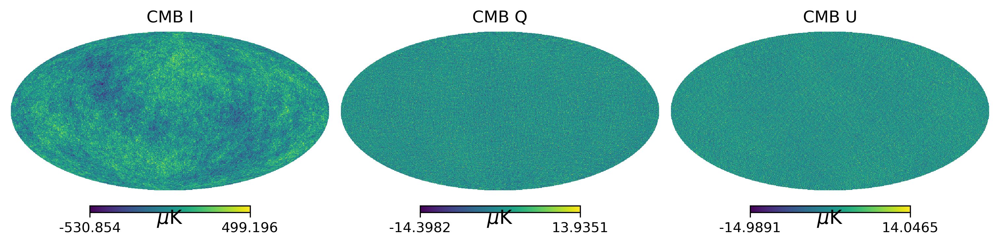

In [8]:
plt.figure(figsize=(10,3), dpi=300)
comp_names = ["I", "Q", "U"]
for i in range(3):
    hp.mollview(cmb[i], sub=(1,3,i+1), title=f"CMB {comp_names[i]}", unit=r"$\mu$K")

Text(0.5, 0, '$\\ell$')

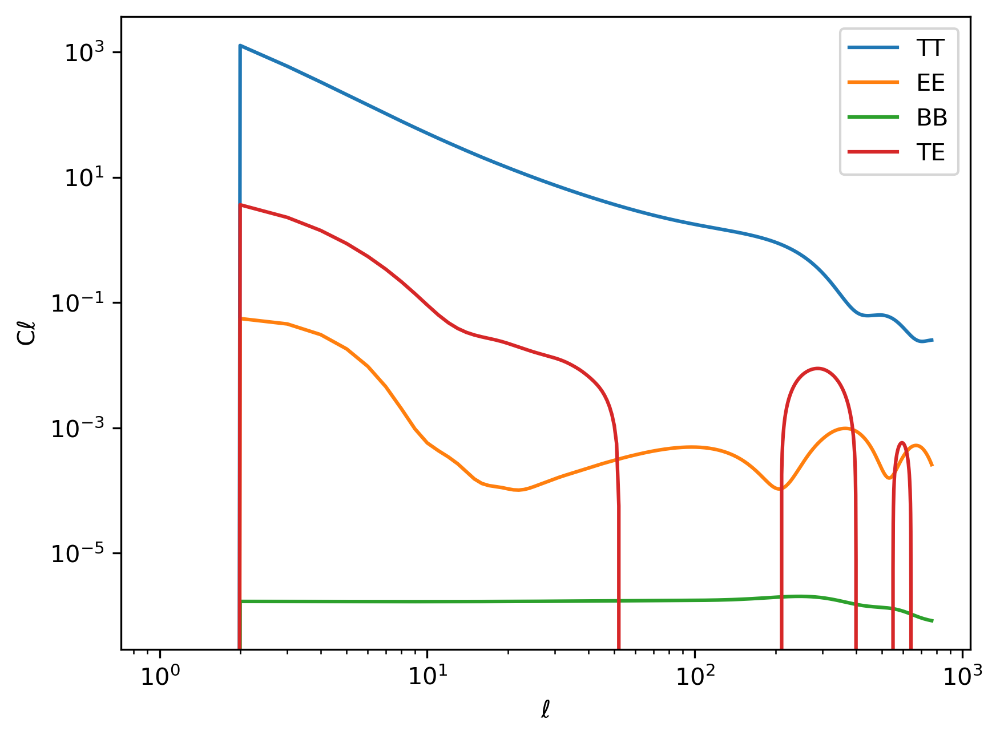

In [17]:
plt.figure(dpi=300)
spec_names = ['TT', 'EE', 'BB', 'TE']
for i in range(4):
    plt.loglog(cmb_spec[i], label=spec_names[i])
plt.legend()
plt.ylabel(r"C$\ell$")
plt.xlabel(r"$\ell$")

### Dust model

Modified blackbody:
$
D_\ell = A_d(\frac{\ell}{80})^\alpha(\frac{\nu}{\nu_0})^{2\beta}(\frac{B_{\nu}(T_d)}{B_{\nu_0}(T_d)})^2
$

Most foreground parameters are stored as a public static field in the sky class where you may access. However, do not change these parameters directly as they will NOT take effect in generating the spectra and maps.
Use `init_dust()` and `init_sync()` to change parameters and regenerate spectra / maps.

If the frequency has been specified, it will return Nfreq of IQU maps

In [18]:
sky.init_dust()
dust = sky.get_dust_maps()
dust_spec = sky.get_dust_theory_cls()

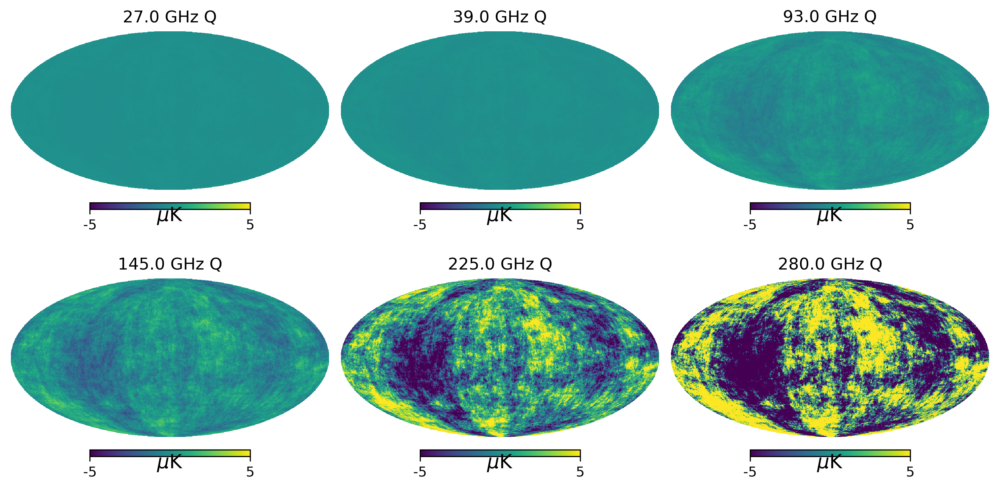

In [26]:
plt.figure(figsize=(10,5), dpi=300)
for i in range(6):
    hp.mollview(dust[i, 1], sub=(2,3,i+1), unit=r"$\mu$K", max=5, min=-5, title=f"{freqs[i]} GHz Q")


Text(0.5, 0, '$\\ell$')

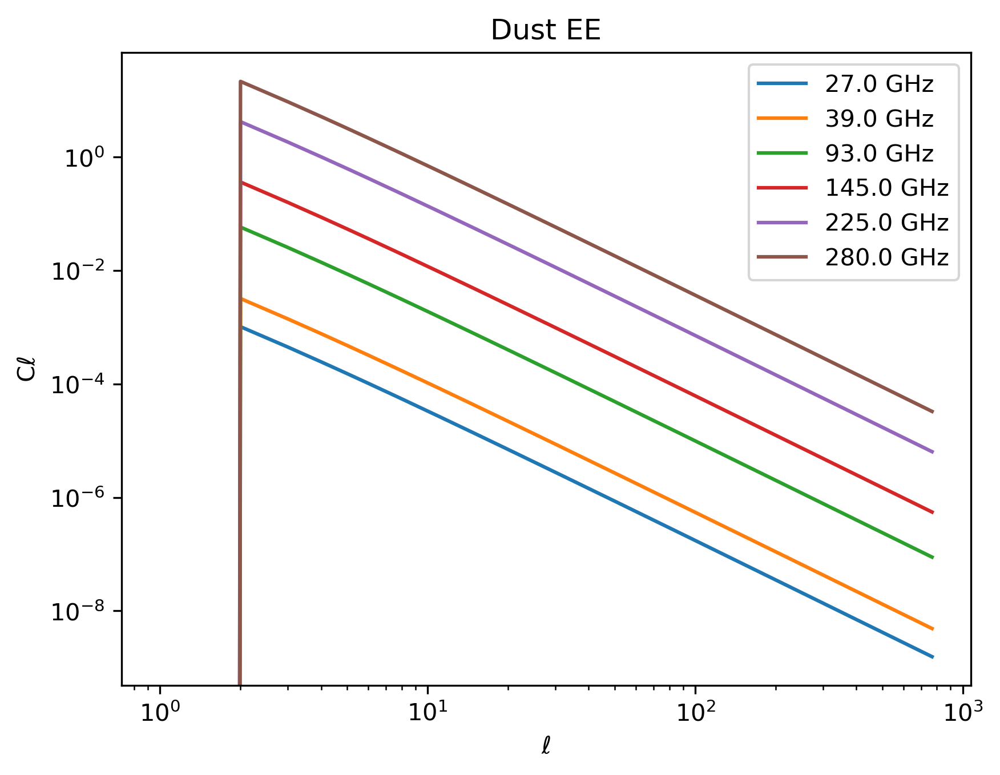

In [31]:
plt.figure(dpi=300)
plt.title("Dust EE")
for i in range(6):
    plt.loglog(dust_spec[i, 1], label=f"{freqs[i]} GHz")
plt.legend()
plt.ylabel(r"C$\ell$")
plt.xlabel(r"$\ell$")

### Synchrotron Model

Power law:
$
D_\ell = A_d(\frac{\ell}{80})^\alpha(\frac{\nu}{\nu_0})^{2\beta}
$

In [28]:
sky.init_sync()
sync = sky.get_sync_maps()
sync_spec = sky.get_sync_theory_cls()

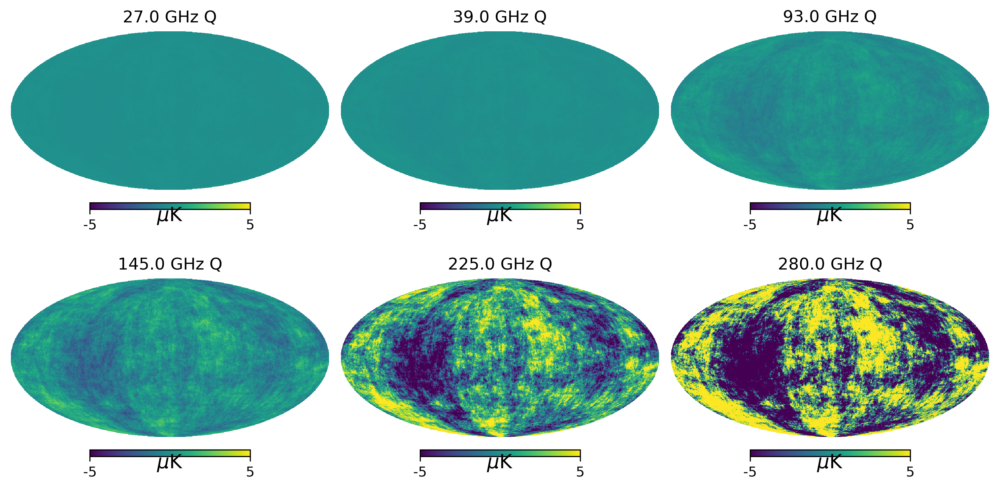

In [29]:
plt.figure(figsize=(10,5), dpi=300)
for i in range(6):
    hp.mollview(dust[i, 1], sub=(2,3,i+1), unit=r"$\mu$K", max=5, min=-5, title=f"{freqs[i]} GHz Q")

Text(0.5, 0, '$\\ell$')

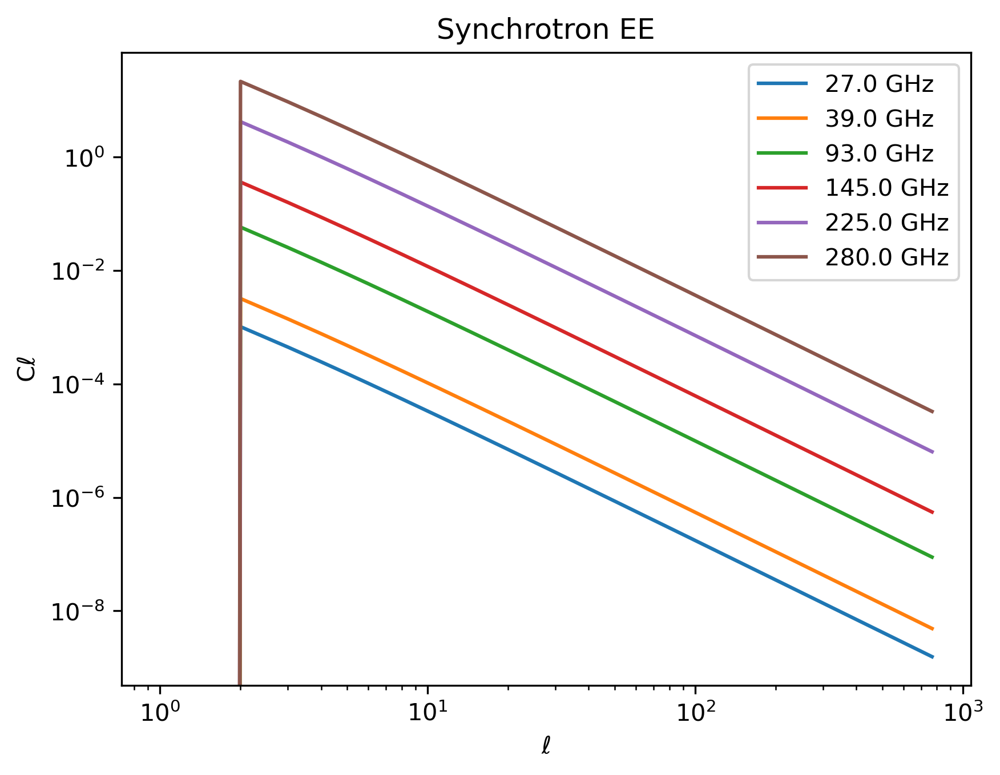

In [32]:
plt.figure(dpi=300)
plt.title("Synchrotron EE")
for i in range(6):
    plt.loglog(dust_spec[i, 1], label=f"{freqs[i]} GHz")
plt.legend()
plt.ylabel(r"C$\ell$")
plt.xlabel(r"$\ell$")

### White noise

simple implementation that converts temperature and polarization sensitivity (in $\mu$K-arcmin) to a white noise realization. Sensitivity needs to be a numpy array.

`dt` and `dp` should have the same size.

In [33]:
sky.init_white_noise()
wn = sky.get_white_noise_maps()

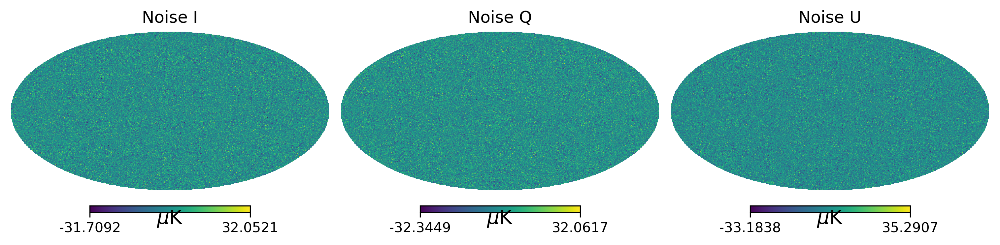

In [37]:
plt.figure(figsize=(10,3), dpi=300)
comp_names = ["I", "Q", "U"]
for i in range(3):
    hp.mollview(wn[0, i], sub=(1,3,i+1), title=f"Noise {comp_names[i]}", unit=r"$\mu$K")

### Other utilities that's potentially useful

Since nside is fixed, sometimes these utilities can be handy

In [40]:
cl2dl = sky.cl2dl # factor to convert cl to dl
dl2cl = sky.dl2cl # factor to convert dl to cl
gauss_beam = sky.gauss_beam(100) # create a gaussian beam given fwhm in arcmin
pixwin = sky.pixwin() # get pixel window function for this nside